In [31]:
import pandas as pd 
import numpy as np
from sklearn.tree import DecisionTreeClassifier
from sklearn import tree 
from sklearn.model_selection import train_test_split , GridSearchCV
from sklearn.metrics import accuracy_score , confusion_matrix , roc_auc_score , roc_curve
from pandas_profiling import ProfileReport
import matplotlib.pyplot as plt
%matplotlib inline

In [5]:
df = pd.read_csv('winequality-red.csv', sep = ";")

In [6]:
df.head()

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
0,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5
1,7.8,0.88,0.00,2.6,0.098,25.0,67.0,0.9968,3.20,0.68,9.8,5
2,7.8,0.76,0.04,2.3,0.092,15.0,54.0,0.9970,3.26,0.65,9.8,5
3,11.2,0.28,0.56,1.9,0.075,17.0,60.0,0.9980,3.16,0.58,9.8,6
4,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5


In [7]:
set(df['quality'])

{3, 4, 5, 6, 7, 8}

In [8]:
ProfileReport(df)

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [9]:
X = df.drop(columns= 'quality')

In [10]:
y = df['quality']

In [12]:
x_train , x_test, y_train,y_test = train_test_split(X,y,test_size = .25,random_state = 30)

In [13]:
from sklearn.ensemble import RandomForestClassifier

In [14]:
rf = RandomForestClassifier(n_estimators= 5)

In [15]:
rf.fit(x_train, y_train)

RandomForestClassifier(n_estimators=5)

In [16]:
rf.score(x_test, y_test)

0.6225

In [17]:
rf.estimators_

[DecisionTreeClassifier(max_features='auto', random_state=2015982941),
 DecisionTreeClassifier(max_features='auto', random_state=2099654931),
 DecisionTreeClassifier(max_features='auto', random_state=1235238055),
 DecisionTreeClassifier(max_features='auto', random_state=1321443622),
 DecisionTreeClassifier(max_features='auto', random_state=222169070)]

In [18]:
grid_pram = {
    "n_estimators" : [5,10 , 50 , 100 , 120 , 150],
    'criterion' :['gini' ,'entropy'],
    'max_depth' :range(10),
    'min_samples_leaf' :range(10)
    
}

In [19]:
rf = RandomForestClassifier(n_estimators=5)

In [22]:
grid_serach_rf = GridSearchCV(param_grid= grid_pram, cv = 5 , n_jobs=6,verbose=1 ,estimator = rf)

In [23]:
grid_serach_rf.fit(x_train, y_train)

Fitting 5 folds for each of 1200 candidates, totalling 6000 fits


C:\Users\SCS\anaconda3\lib\site-packages\sklearn\model_selection\_search.py:922: UserWarning: One or more of the test scores are non-finite: [       nan        nan        nan ... 0.61884589 0.61967922 0.63469665]
  warnings.warn(


GridSearchCV(cv=5, estimator=RandomForestClassifier(n_estimators=5), n_jobs=6,
             param_grid={'criterion': ['gini', 'entropy'],
                         'max_depth': range(0, 10),
                         'min_samples_leaf': range(0, 10),
                         'n_estimators': [5, 10, 50, 100, 120, 150]},
             verbose=1)

In [24]:
grid_serach_rf.best_params_

{'criterion': 'entropy',
 'max_depth': 9,
 'min_samples_leaf': 2,
 'n_estimators': 50}

In [25]:
grid_serach_rf.best_score_

0.6622210599721059

In [26]:
rf_new = RandomForestClassifier(criterion= 'entropy', max_depth=9,min_samples_leaf=2,n_estimators=50)

In [28]:
rf_new.fit(x_train, y_train)

RandomForestClassifier(criterion='entropy', max_depth=9, min_samples_leaf=2,
                       n_estimators=50)

In [29]:
rf_new.score(x_test, y_test)

0.6775

[Text(414.54815864022663, 1032.8400000000001, 'X[4] <= 0.069\nentropy = 1.679\nsamples = 757\nvalue = [8, 33, 514, 486, 146, 12]'),
 Text(158.8640226628895, 924.1200000000001, 'X[1] <= 0.385\nentropy = 1.767\nsamples = 164\nvalue = [0, 8, 64, 116, 64, 4]'),
 Text(75.87535410764872, 815.4000000000001, 'X[7] <= 0.995\nentropy = 1.599\nsamples = 70\nvalue = [0, 2, 9, 38, 51, 3]'),
 Text(34.77620396600567, 706.6800000000001, 'X[9] <= 0.695\nentropy = 1.172\nsamples = 34\nvalue = [0, 0, 2, 11, 38, 2]'),
 Text(12.645892351274787, 597.96, 'X[0] <= 6.6\nentropy = 0.998\nsamples = 14\nvalue = [0, 0, 0, 9, 8, 0]'),
 Text(6.3229461756373935, 489.24, 'entropy = 0.0\nsamples = 3\nvalue = [0, 0, 0, 3, 0, 0]'),
 Text(18.96883852691218, 489.24, 'X[1] <= 0.23\nentropy = 0.985\nsamples = 11\nvalue = [0, 0, 0, 6, 8, 0]'),
 Text(12.645892351274787, 380.5200000000001, 'entropy = 0.0\nsamples = 4\nvalue = [0, 0, 0, 4, 0, 0]'),
 Text(25.291784702549574, 380.5200000000001, 'X[10] <= 11.8\nentropy = 0.722\nsam

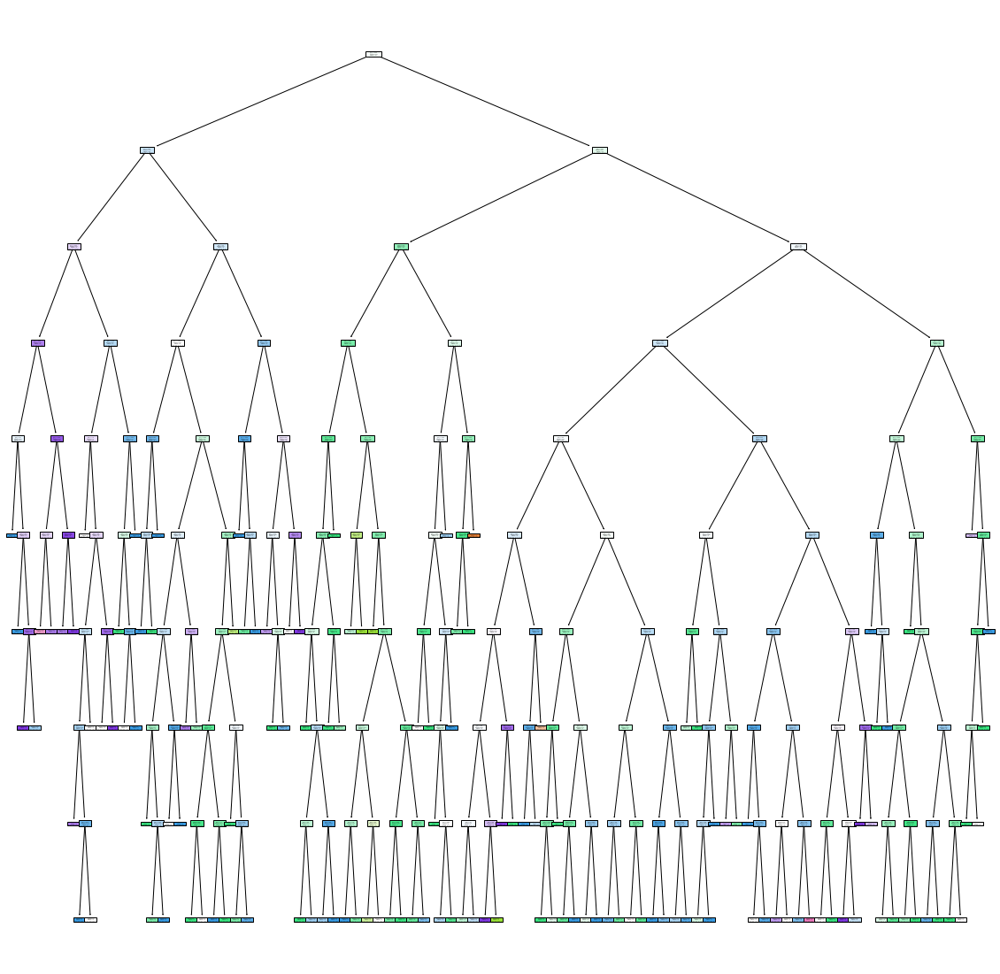

In [32]:
plt.figure(figsize = (20,20))
tree.plot_tree(rf_new.estimators_[0] , filled = True )